In [1]:
import astroprov
from astropy.io import fits
from astropy.io.ascii import SExtractor
from astropy.stats import sigma_clipped_stats
from astropy.coordinates import SkyCoord
import astropy.units as u
import matplotlib.pyplot as plt
import numpy as np
import os
from photutils import DAOStarFinder
from photutils import CircularAperture
from photutils import aperture_photometry
#import subproc

import numpy as np
from astropy import wcs
from astropy.io import fits
import sys

from astroquery.simbad import Simbad

import matplotlib.pyplot as plt
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.table import Table
from astropy.table import Column

import collections
import subprocess

In [2]:
imagedirectory = '/home/mj1e16/keplerImages'
imagedirectory

newImagelist = []
Image = os.listdir(imagedirectory)
for i, item in enumerate(Image):
    if item.find('.fits') != -1:
        #print(i,Image[i].find('.fits'))
        newImagelist.append(item)
Image = newImagelist


FWHM = 5.0
MinSep = 0.8 #sets value for discriminating sources
N = len(Image) #number of images minus 1 as it starts from zero
imno = 0
imagedata = []
sources = dict()
Date = []
STD = []
Median = []


os.chdir(imagedirectory)
def daoStarFinder(imagename):
    """
    Locates and measures the brightness of all objects in the image as well as the sky background
    and other image data.

    :param imagenumber: Position of image in directory
    :return: Table of object data, date of observation, image data for backround calculation
    """
    #print(Image[imagenumber])
    hdu_list = fits.open(imagename) # open image header
    imagedata = (hdu_list[0].data) 
    mean, median, std = sigma_clipped_stats(imagedata, sigma=3.0, iters=5) 
    Median.append(median)
    STD.append(std)
    daofind = DAOStarFinder(fwhm=FWHM, threshold=5.*std) # iraf star finder 
    Sources = daofind(imagedata - median)
    #Date = (hdu_list[0].header['MJD'])
    output = {}
    output[0] = Sources
    output[1] = Date
    output[2] = imagedata
    
    fig, ax = plt.subplots(figsize=(10, 10))
    positions = (output[0]['xcentroid'], output[0]['ycentroid'])
    apertures = CircularAperture(positions, r=4.)
    norm = ImageNormalize(stretch=SqrtStretch())
    ax.imshow(imagedata, cmap='Greys', origin='lower', vmin=-100,vmax=100)#norm=norm)
    apertures.plot(color='blue', lw=1.5, alpha=0.5)
    plt.savefig('fits.png',dpi=100)
    plt.show()
    
    
    
#     os.chdir(bindingsdirectory)
#     astroprov.provcall([imagenumber],[output[0],output[1],output[2]],"daoStarFinder_PythonCode2Images_SQ_tmpl.provn","daoStarFinder")
#     os.chdir(imagedirectory)
    return output




In [3]:
def load_wcs_from_file(filename,pixCoord):
    # Load the FITS hdulist using astropy.io.fits
    hdulist = fits.open(filename)

    # Parse the WCS keywords in the primary HDU
    w = wcs.WCS(hdulist[0].header)

    # Print out the "name" of the WCS, as defined in the FITS header
    #print(w.wcs.name)

    # Print out all of the settings that were parsed from the header
    w.wcs.print_contents()

    # Three pixel coordinates of interest.
    # Note we've silently assumed a NAXIS=2 image here.
    # Note also that the pixel coordinates are pairs of [X, Y], 
    # and since WCS built from FITS header automatically has
    # origin set to 1, [0, 0] is actually not inside the image.
    pixcrd = np.array(pixCoord, dtype=np.float_)

    # Convert pixel coordinates to world coordinates
    # The second argument is "origin" -- in this case we're declaring we
    # have 1-based (Fortran-like) coordinates.
    world = w.wcs_pix2world(pixcrd, 1)
    #print(world)
    return(world)
#     # Convert the same coordinates back to pixel coordinates.
#     pixcrd2 = w.wcs_world2pix(world, 1)
#     print(pixcrd2)

#     # These should be the same as the original pixel coordinates, modulo
#     # some floating-point error.
#     assert np.max(np.abs(pixcrd - pixcrd2)) < 1e-6




In [4]:
def queryObjectRegion(outputTable,imageName,inCat,searchRadius=5*u.arcsecond):
    imageCoords = []
    r = searchRadius
    
    if inCat == 'dao':
        xlabel = 'xcentroid'
        ylabel = 'ycentroid'
        label = 'id'
        
    if inCat == 'sex':
        xlabel = 'X_IMAGE'
        ylabel = 'Y_IMAGE'
        label = 'NUMBER'
        
    tableLength = outputTable[label][-1]
    for x in range(tableLength):
        xpos = outputTable[xlabel][x]
        ypos = outputTable[ylabel][x]
        if 20 < ypos < 1040:
            if 12 < xpos < 1110:
                imageCoords.append([xpos,ypos])
                # this may need to change per image but I hope not

    coords = load_wcs_from_file(imageName,imageCoords)
    customSimbad = Simbad()
    customSimbad.add_votable_fields('ra(d)','dec(d)','otype')
    customSimbad.remove_votable_fields('coordinates')
            
    result_table = Table([['-'],[0],[0],['-'],[0],[0]],names=('MAIN_ID','RA_d','DEC_d','OTYPE','xcentroid','ycentroid'),dtype=('object','float64','float64','object','float64','float64'))

    for x in range(len(imageCoords)):
        try:
            c = SkyCoord(coords[x][0],coords[x][1],frame='icrs',unit='deg')
            rt = customSimbad.query_region(c,radius=r)
            rowlist = []
            for y in range(len(rt[0])):
                rowlist.append(rt[0][y])
            rowlist.append(imageCoords[x][0])
            rowlist.append(imageCoords[x][1])
            result_table.add_row(rowlist)

        except:
            result_table.add_row(['N/A',[0],[0],'Possible Transient',[imageCoords[x][0]],[imageCoords[x][1]]])
    
    hdu_list = fits.open(imageName)
    imagedata = (hdu_list[0].data) 
    fig, ax = plt.subplots(figsize=(10, 10))
    positions = (outputTable[xlabel], outputTable[ylabel])
    apertures = CircularAperture(positions, r=4.)
    norm = ImageNormalize(stretch=SqrtStretch())
    ax.imshow(imagedata, cmap='Greys', origin='lower', vmin=-100,vmax=100)#norm=norm)
    apertures.plot(color='blue', lw=1.5, alpha=0.5)
    #plt.savefig('fits.png',dpi=100)
    plt.show()
    
    return result_table

In [5]:
def alterDefault(defaultDir,valList,attributeList):
    
    with open(defaultDir+'/default.sex','r') as f:
        data  = f.read()
    for x in range(len(valList)):
        nameLoc = data.find(attributeList[x]) + len(attributeList[x])
        endLoc = data[nameLoc:].find('#') + nameLoc
        newData = data[:nameLoc] + ' '+str(valList[x])+' ' + data[endLoc:]
        data = newData
    
#     with open(defaultDir+'/default.sex','r') as f:
#         endData = f.read()
#     cname = 'CATALOG_NAME'
#     nameLoc = endData.find(cname) + len(cname)
#     endLoc = data[nameLoc:].find('#') + nameLoc
#     newData = data[:nameLoc] + '' + data[endLoc:]
    
    with open(defaultDir+'/default.sex','w') as f:
        f.write(data)

In [7]:
alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[3,5],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])

In [11]:
def sextractor(sextractoryDir,imagename,cataloguename,imageDir='/home/mj1e16/keplerImages/'):
    os.chdir(sextractoryDir)
    subprocess.call(['sex','/home/mj1e16/keplerImages/'+imagename])
    assoc = Table.read(cataloguename,format='ascii.sextractor')

    os.chdir(imageDir)
    hdu_list = fits.open(imagename) # open image header
    imagedata = (hdu_list[0].data) 
    
    fig, ax = plt.subplots(figsize=(10, 10))
    positions = (assoc['X_IMAGE'], assoc['Y_IMAGE'])
    apertures = CircularAperture(positions, r=4.)
    norm = ImageNormalize(stretch=SqrtStretch())
    ax.imshow(imagedata, cmap='Greys', origin='lower', vmin=-100,vmax=100)#norm=norm)
    apertures.plot(color='blue', lw=1.5, alpha=0.5)
    #plt.savefig('fits.png',dpi=100)
    plt.show()
    
    print(len(assoc))
    mags = assoc['MAG_APER']
    plt.hist(mags,bins='auto')
    plt.show()
    return assoc

In [7]:
def findObjectOccurences(inputTable,columnName):
    otype = inputTable[columnName]
    otypelist = []
    for x in range(len(otype)):
        otypelist.append(otype[x])
    #print(len(otypelist))
    newotype = set(otypelist)
    counter = collections.Counter(otypelist)
    keys = counter.keys()
    values = counter.values()
    occurenceDict = dict(zip(keys,values))
    od = collections.OrderedDict(sorted(occurenceDict.items()))
    return od

In [8]:
def foundInBoth(daoTable,sexTable):
    
    # currently works after both have been checked through vizier - change sex x and y labels to X_IMAGE and Y_IMAGE otherwise
    simdifsize = 5
    
    daox = daoTable['xcentroid'].tolist()
    #daox = [round(x,1) for x in daox]
    daoy = daoTable['ycentroid'].tolist()
    #daoy = [round(x,1) for x in daoy]
    #daocoords = zip(daox,daoy)
    #print(daocoords)
    
    sexx = sexTable['xcentroid'].tolist()
    #sexx = [round(x,1) for x in sexx]
    sexy = sexTable['ycentroid'].tolist()
    #sexy = [round(x,1) for x in sexy]

    commonIndicies = [[x,y] for x,y,z,v in zip(daox,daoy,sexx,sexy) if z-simdifsize < x < z+simdifsize and v-simdifsize < y < v+simdifsize]
    
    return commonIndicies

In [9]:
def makeDS9RegFile(sexTabList,fileNameBase):
    for tables in range(len(sexTabList)):
        xcoords = sexTabList[tables]['X_IMAGE']
        ycoords = sexTabList[tables]['Y_IMAGE']
        bigString = 'global color=lightgreen\nimage\n'
        for x in range(len(xcoords)):
            bigString += 'circle({},{},5)\n'.format(xcoords[x],ycoords[x])
        fileName = fileNameBase + str(tables)+'.reg'
        with open(fileName,'w') as f:
            f.write(bigString)

In [10]:
def makeDS9RegFile(sexTabList,fileNameBase,tabType):
    for tables in range(len(sexTabList)):
        if tabType == 'dao':
            xcoords = sexTabList[tables]['xcentroid']
            ycoords = sexTabList[tables]['ycentroid']
        elif tabType == 'sex':
            xcoords = sexTabList[tables]['X_IMAGE']
            ycoords = sexTabList[tables]['Y_IMAGE']
        else:
            print('tab type error')
            break
        bigString = 'global color=lightgreen\nimage\n'
        for x in range(len(xcoords)):
            bigString += 'circle({},{},5)\n'.format(xcoords[x],ycoords[x])
        fileName = fileNameBase + str(tables)+'.reg'
        with open(fileName,'w') as f:
            f.write(bigString)

In [53]:
makeDS9RegFile(sexTabs,'/home/mj1e16/ds9Tables/sexKep','sex')

In [60]:
makeDS9RegFile([daotable],'/home/mj1e16/ds9Tables/doaKep','dao')

In [12]:
imageName = 'difkplr2009115080620_ffi-cal57.fits'

In [68]:
sexTabs[0]

NUMBER,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,FLUX_APER,FLUXERR_APER,FLUX_RADIUS,FWHM_IMAGE,BACKGROUND,THRESHOLD,FLUX_MAX,ISOAREA_IMAGE,A_IMAGE,B_IMAGE,THETA_IMAGE,FLAGS
,pix,pix,deg,deg,ct,ct,pix,pix,ct,ct,ct,pix2,pix,pix,deg,
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,int64
1,813.994,82.242,293.2217905,47.6806545,105.2791,7.633492,165.078,10.04,0.7350117,5.156928,23.4184,126,36.386,0.077,-89.99,19
2,813.9291,632.0077,292.7511895,48.199702,121.5708,7.617993,27.734,29.03,0.4036083,5.156928,43.40718,168,34.105,0.686,89.65,3
3,813.9284,499.4808,292.865525,48.0747637,139.1198,7.594685,196.262,49.46,-0.08526266,5.156928,101.1615,315,58.951,1.151,89.87,19
4,813.9556,210.9583,293.1124899,47.8023598,112.2012,7.610231,-147.83,50.89,0.7320713,5.156928,128.5092,242,84.536,0.85,89.98,19
5,691.7411,42.8867,293.4269706,47.7130726,75.82024,7.579106,4.306,4.78,-0.4539214,5.156928,16.50705,8,1.713,0.378,82.38,0
6,179.0866,22.9327,294.1692729,47.983289,770.6243,7.594685,1.127,8.7,-0.05852193,5.156928,382.9797,22,1.781,1.188,-38.84,3
7,182.1613,25.3023,294.1629191,47.9838261,423.1051,7.586899,0.795,3.71,-0.06474742,5.156928,329.7498,11,1.88,0.778,-43.3,3
8,1036.1406,21.2361,292.9624378,47.4958007,98.68668,7.633492,1.364,5.07,-0.1291373,5.156928,56.16802,9,1.398,0.519,-58.92,0


In [13]:
sexTabs = []

for x in range(10):
    alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[3,5,64,x],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])
    sexTabs.append(sextractor('/home/mj1e16/sextractor/sextractor-master/config/',imageName,'test.cat'))
makeDS9RegFile(sexTabs,'/home/mj1e16/ds9Tables/sexKepBackSize','sex')

IOError: [Errno 2] No such file or directory: 'difkplr2009115080620_ffi-cal57.fits'

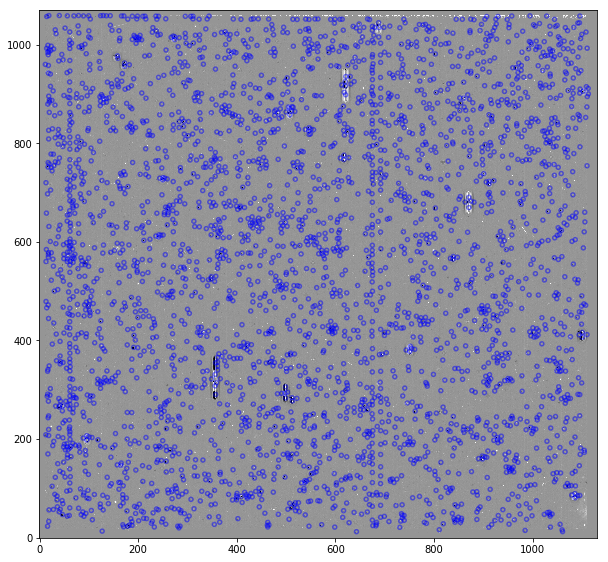

3288


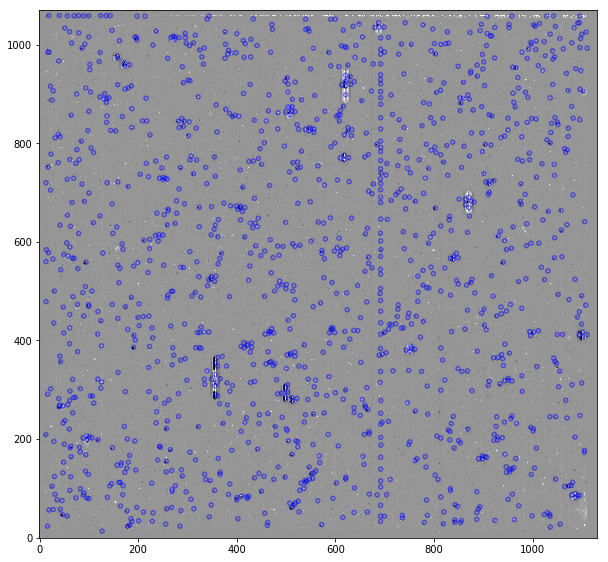

1338


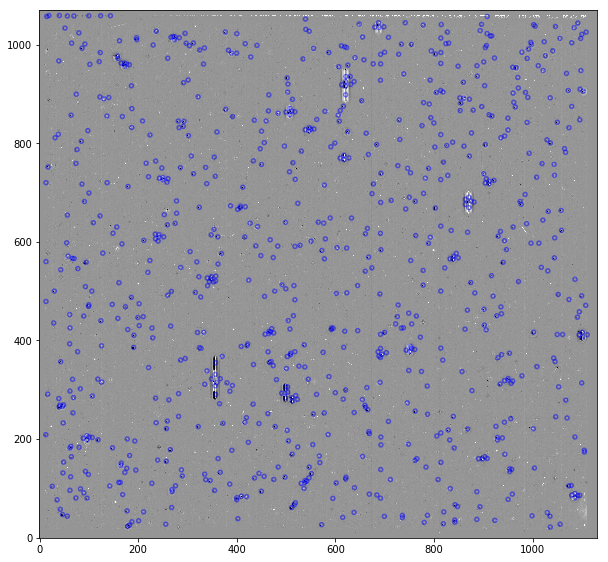

849


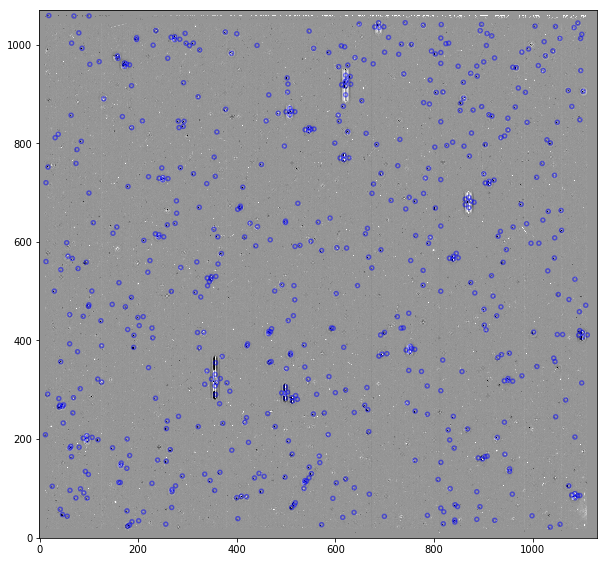

609


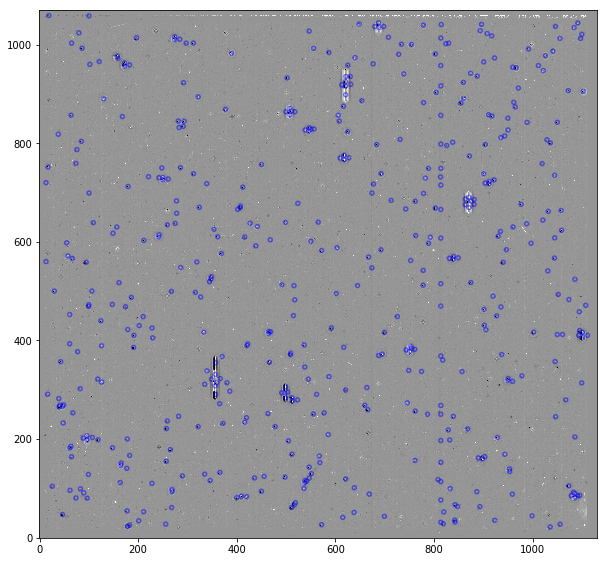

494


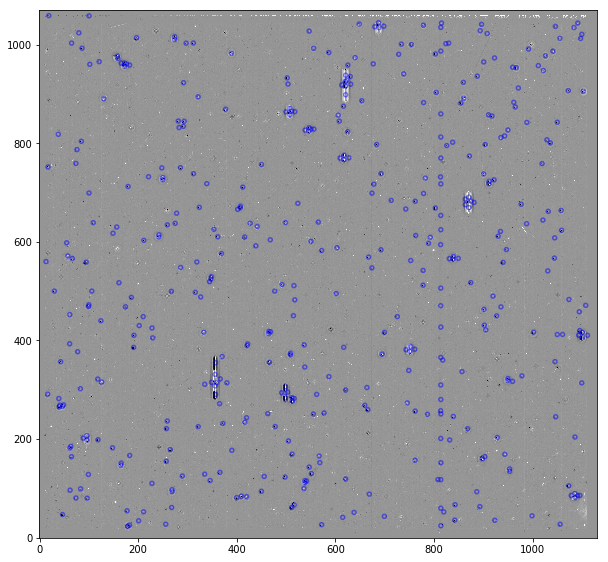

447


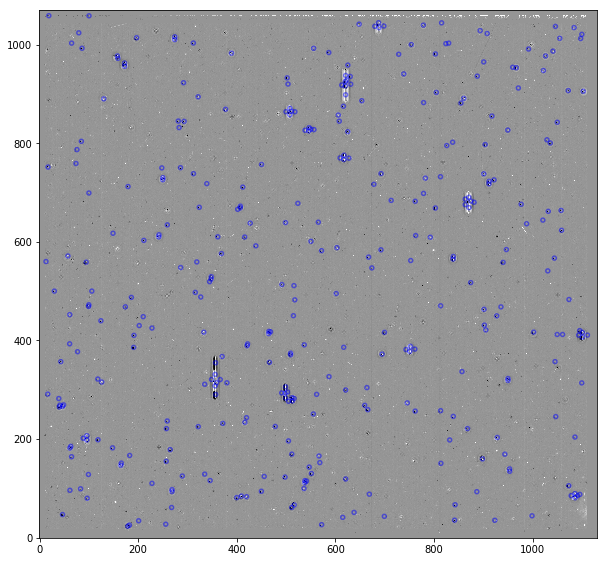

354


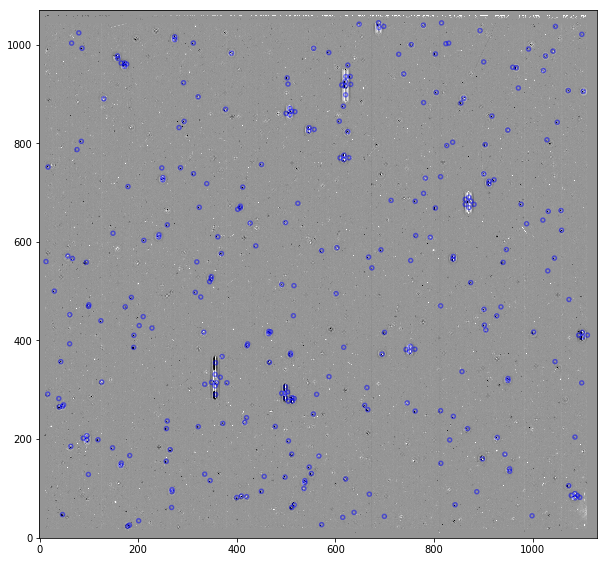

310


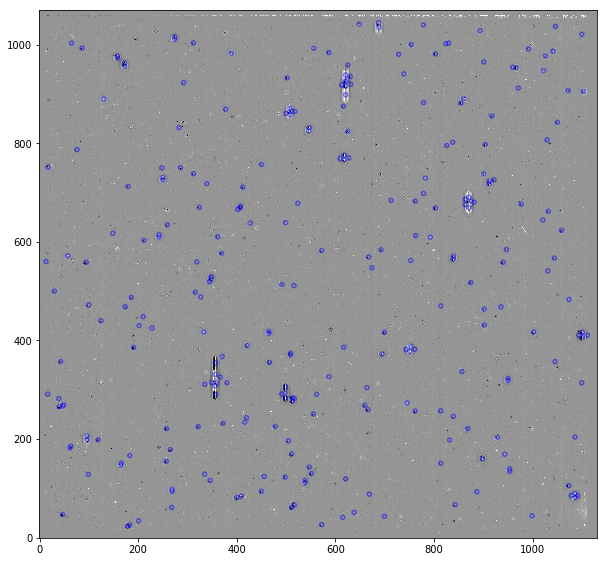

273


In [62]:
sexTabs = []

for x in range(1,10):
    alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[x,5,64,3],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])
    sexTabs.append(sextractor('/home/mj1e16/sextractor/sextractor-master/config/',imageName,'test.cat'))

makeDS9RegFile(sexTabs,'/home/mj1e16/ds9Tables/sexKepThresh','sex')

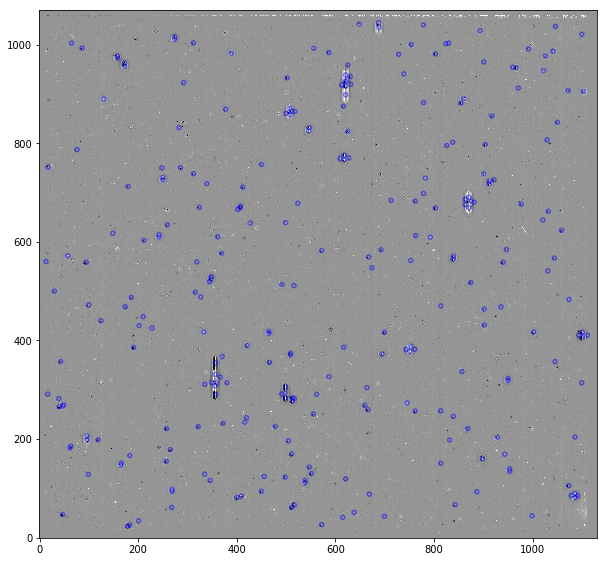

273


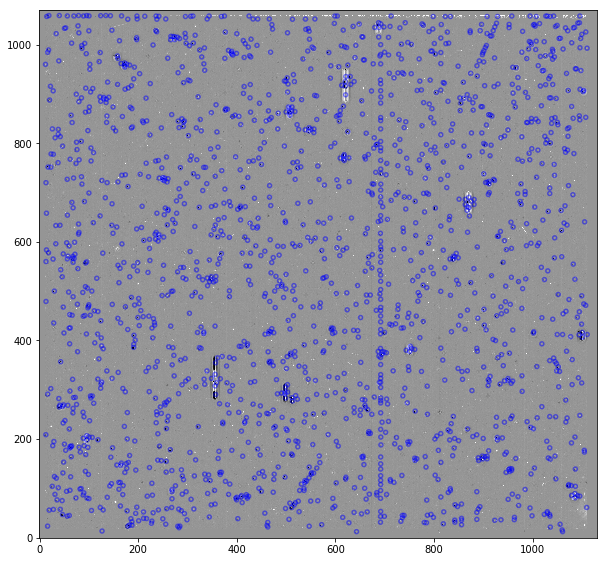

1848


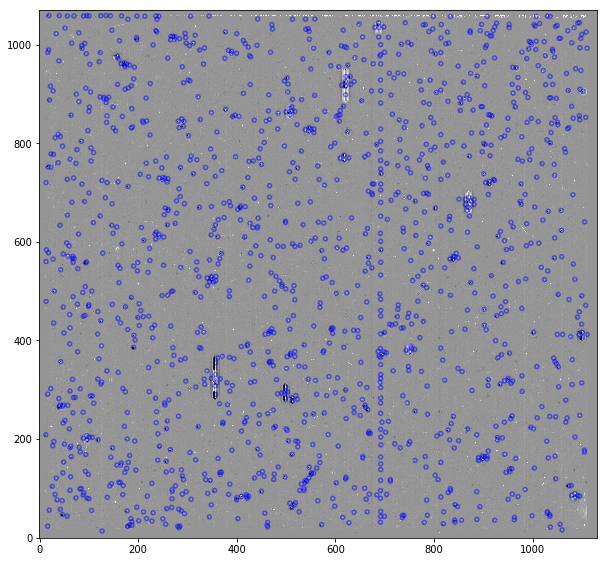

1416


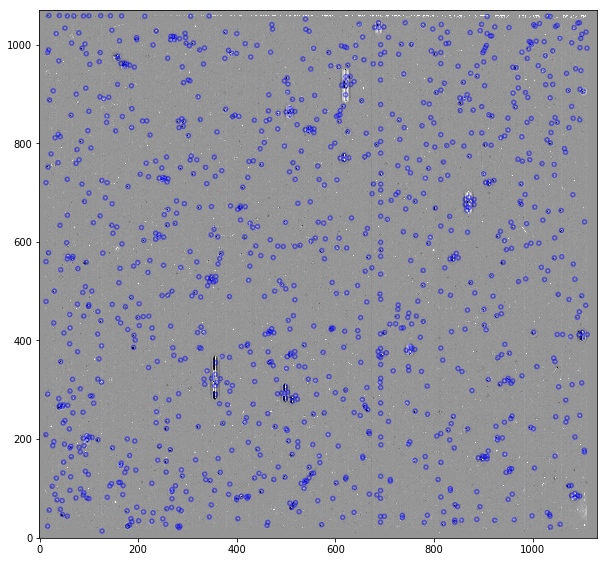

1129


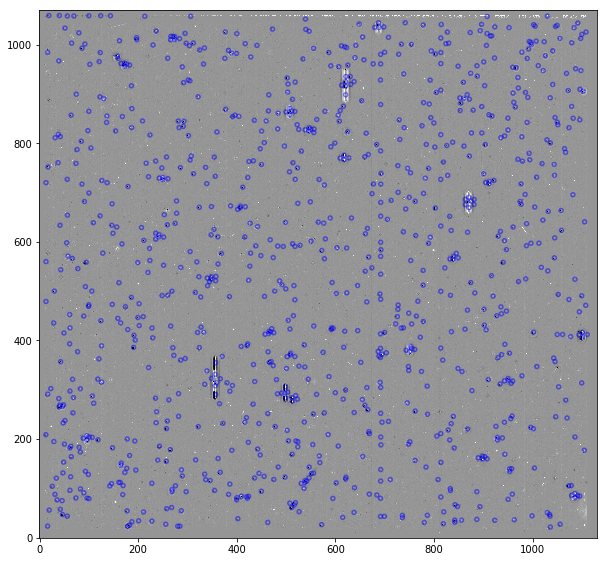

996


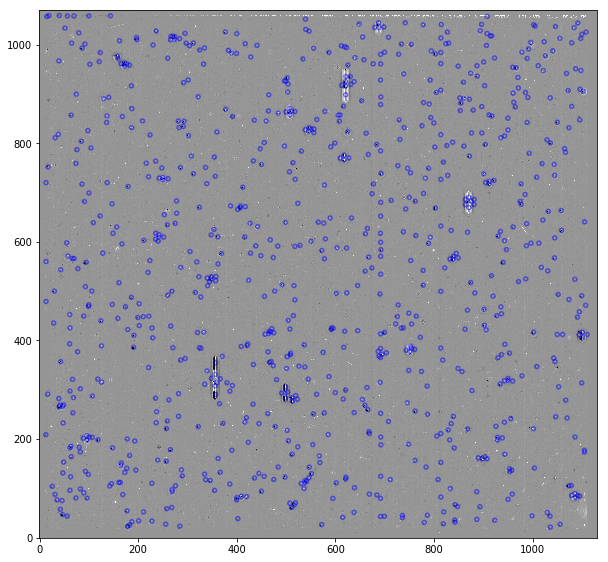

872


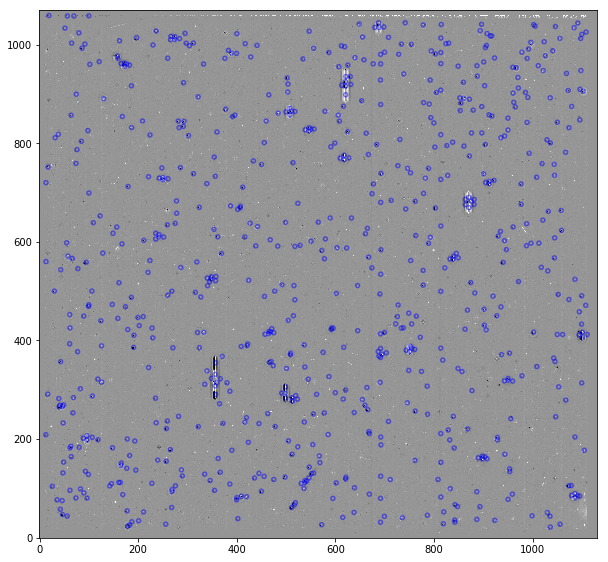

743


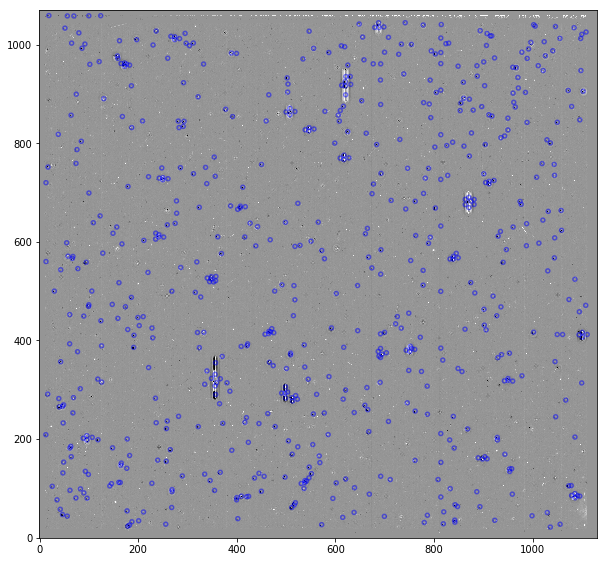

647


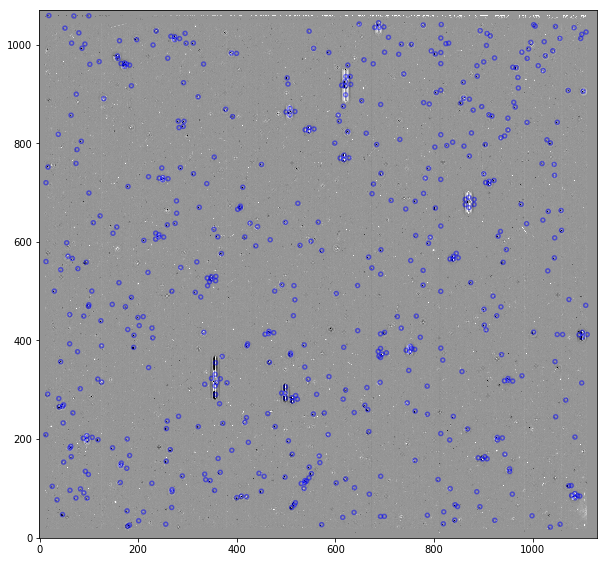

555


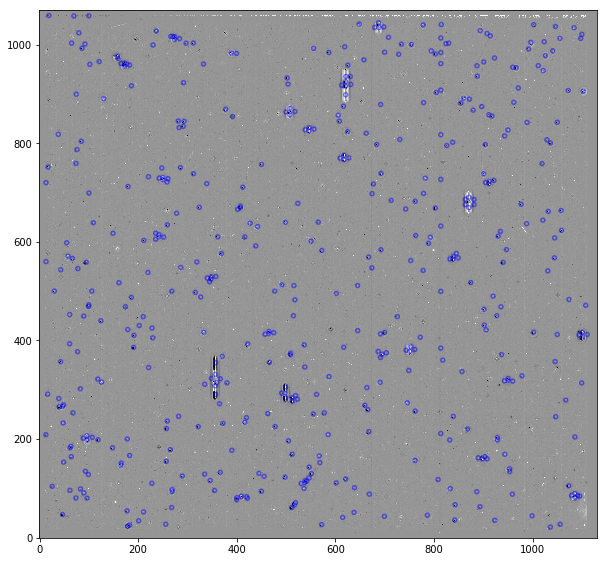

489


In [63]:
sexTabs = []

for x in range(10):
    alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[3,x,8,3],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])
    sexTabs.append(sextractor('/home/mj1e16/sextractor/sextractor-master/config/',imageName,'test.cat'))

makeDS9RegFile(sexTabs,'/home/mj1e16/ds9Tables/sexKepMinArea','sex')

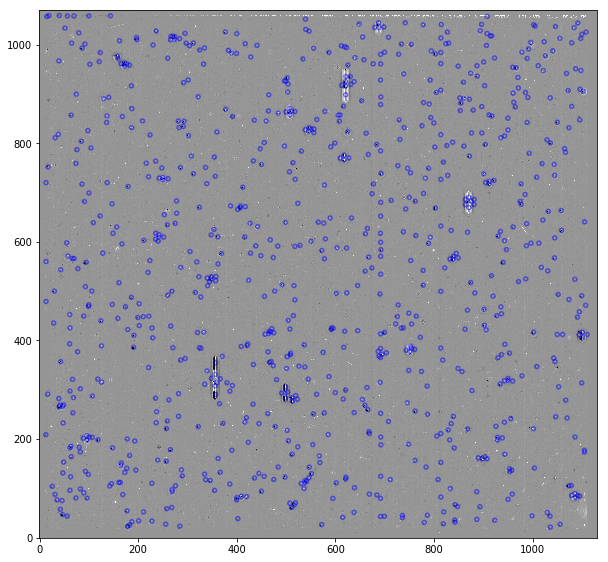

872


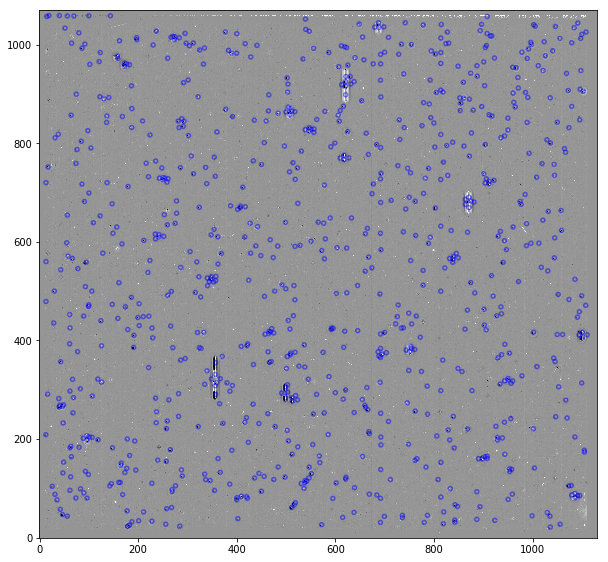

870


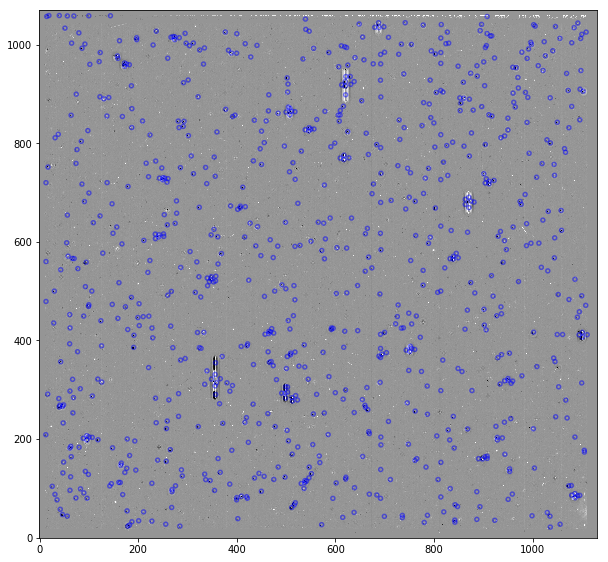

862


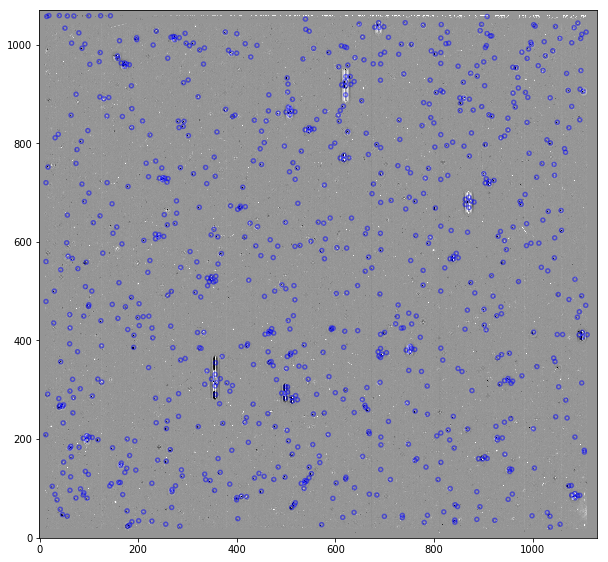

858


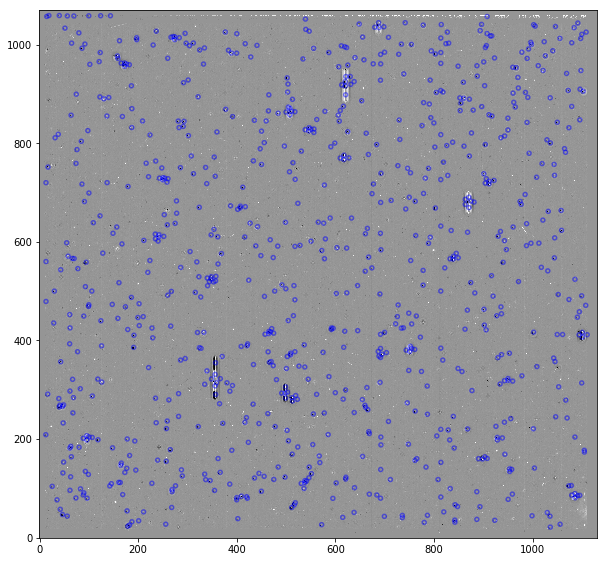

852


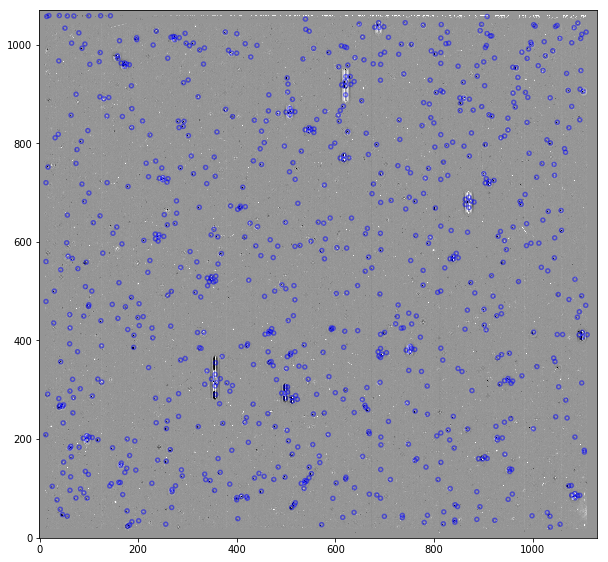

853


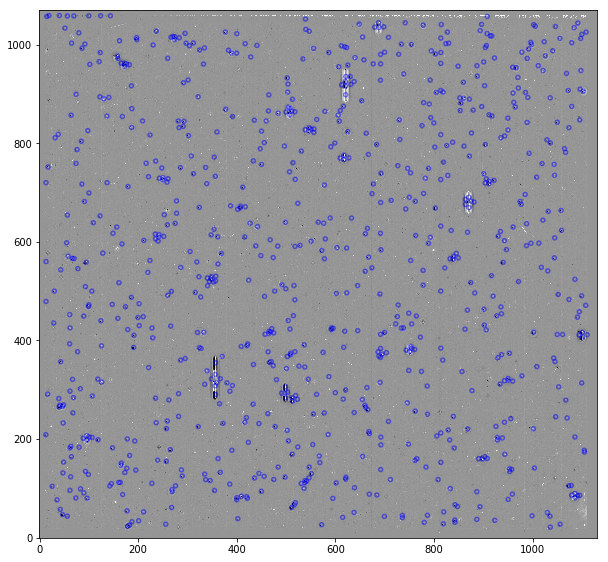

850


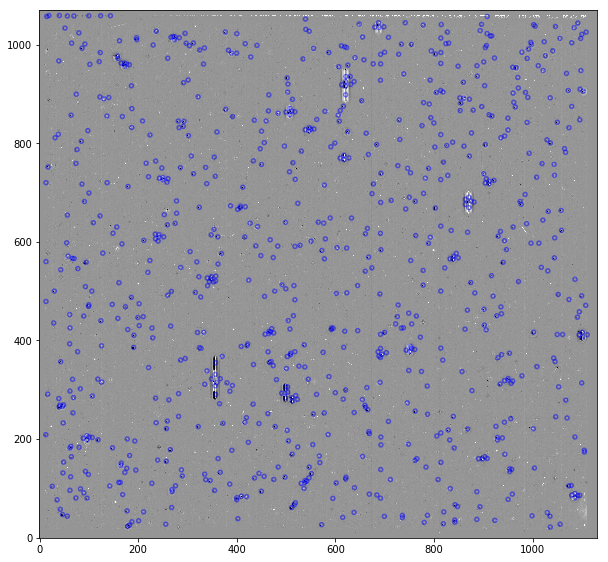

849


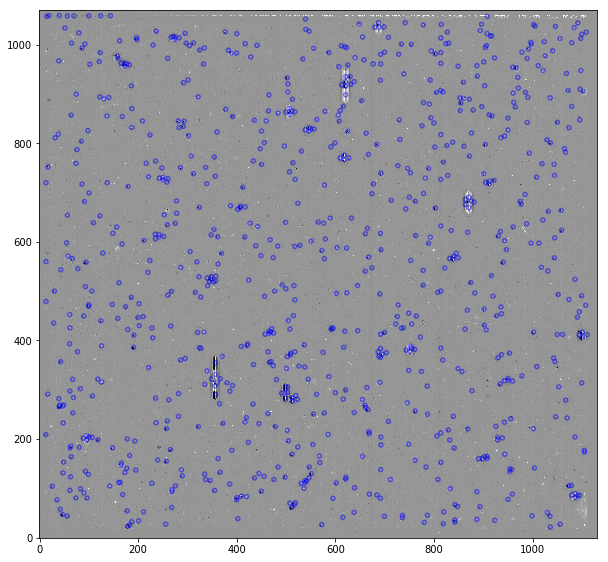

846


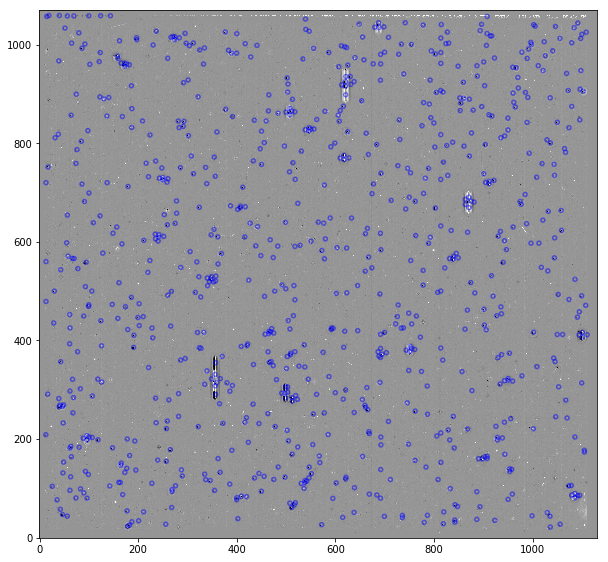

845


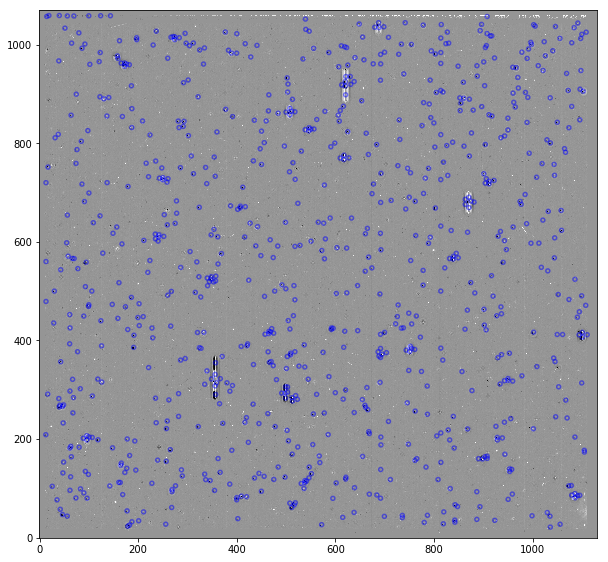

848


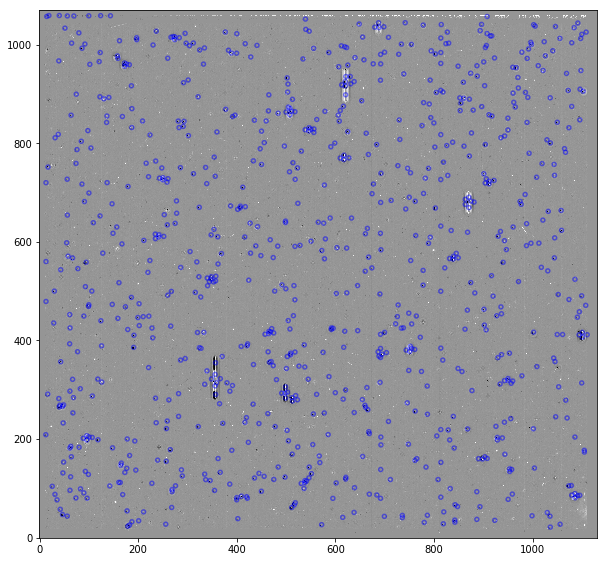

860


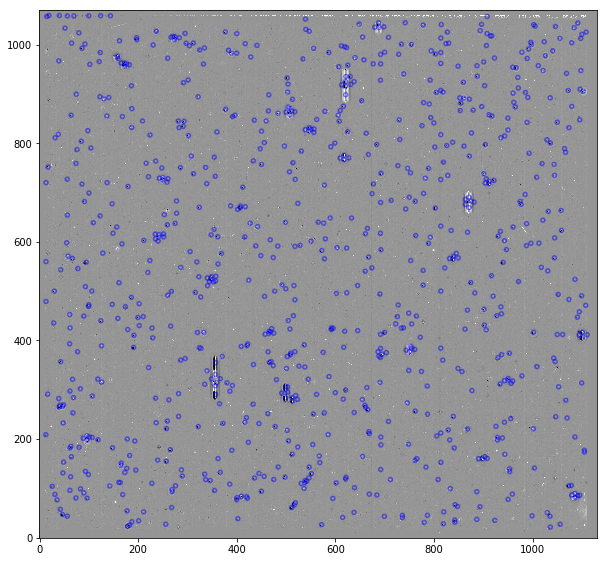

856


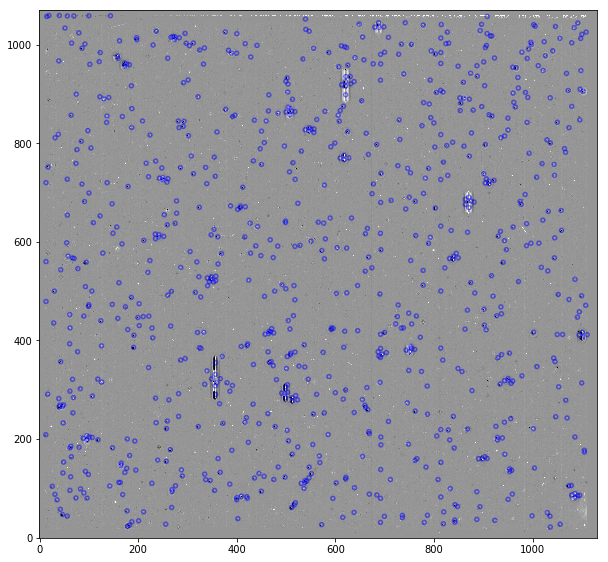

864


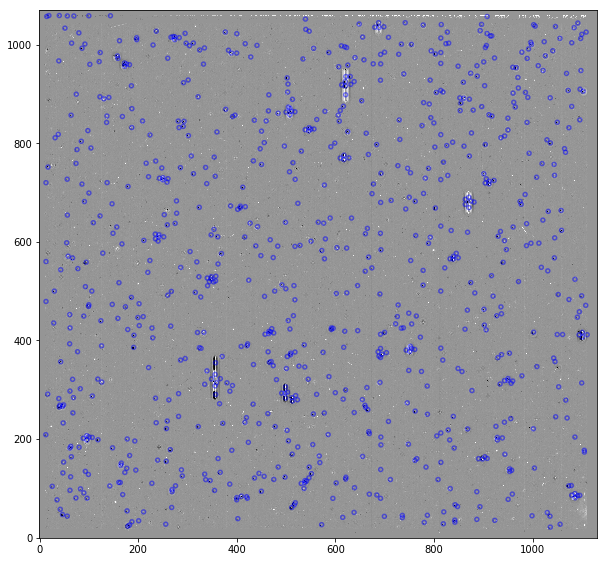

855


In [66]:
sexTabs = []

for x in range(8,128,8):
    alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[3,5,x,3],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])
    sexTabs.append(sextractor('/home/mj1e16/sextractor/sextractor-master/config/',imageName,'test.cat'))

makeDS9RegFile(sexTabs,'/home/mj1e16/ds9Tables/sexKepMinArea','sex')

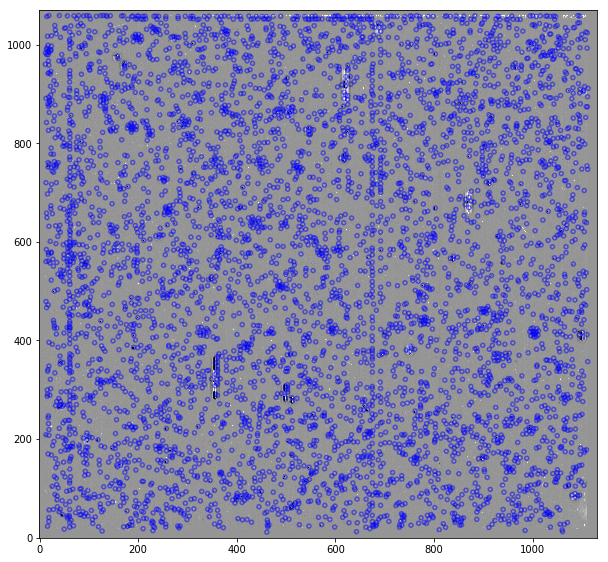

In [11]:
sextable = sextractor('/home/mj1e16/sextractor/sextractor-master/config/','difkplr2009115080620_ffi-cal57.fits[0]','test.cat')

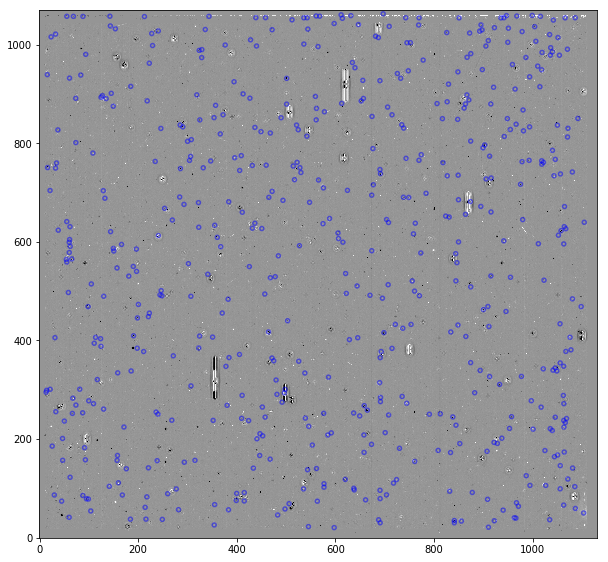

In [54]:
output = daoStarFinder('difkplr2009115080620_ffi-cal57.fits')
daotable = output[0]
Date = output[1]
imagedata = output[2]

In [55]:
print(daotable)

 id     xcentroid      ...        flux                mag         
--- ------------------ ... ------------------ --------------------
  1  597.6233512613425 ... 1.0338140662933049 -0.03610609243660765
  2  910.6143403168055 ... 1.3893744523565545  -0.3570482721480185
  3  545.4766473925444 ... 1.3025182304206904  -0.2869595263122093
  4 354.25688563260917 ... 1.6590794005180816  -0.5496679276614114
  5  690.9898124571824 ... 1.3946931908315614  -0.3611967014905836
  6  841.4058779949274 ...  4.208500703416876   -1.560318510251839
  7  855.7220569154483 ... 2.5656230795272066   -1.022982134281615
  8  841.3475074896459 ... 6.2538789234781405  -1.9903736723702856
  9  922.5092473775792 ...    4.3730483427967   -1.601960695931202
 10  687.8029191125012 ... 1.1126410128791608 -0.11588766089505818
...                ... ...                ...                  ...
550               88.0 ... 2.2804147753504385  -0.8950346155964779
551 212.72887830648583 ... 2.0062581908063555  -0.755967057038

In [13]:
#coords = load_wcs_from_file('difkplr2009115080620_ffi-cal57.fits',imageCoords)

/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:34:18.8953 +47:44:41.8572': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:32:33.1705 +47:34:02.9897': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:34:36.1435 +47:46:35.0964': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/as

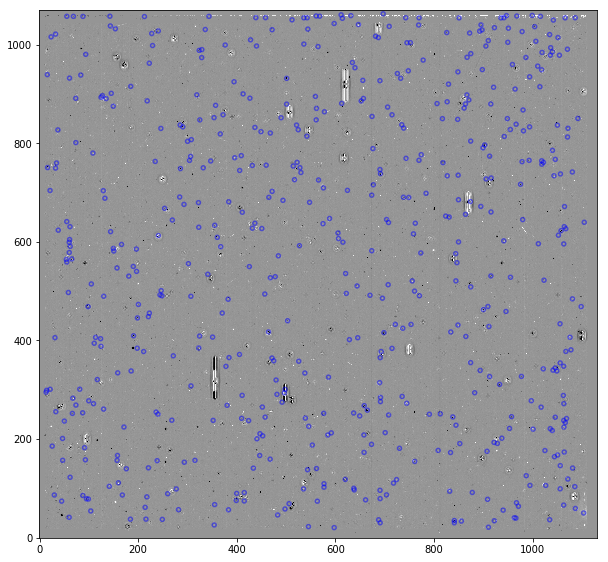

In [ ]:
result_table_dao = queryObjectRegion(daotable,'difkplr2009115080620_ffi-cal57.fits','dao')

In [ ]:
result_table_sex = queryObjectRegion(sextable,'difkplr2009115080620_ffi-cal57.fits','sex')

/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:33:56.954 +47:42:33.2485': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:37:21.3903 +48:02:50.5957': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astroquery/simbad/core.py:136: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '19:37:01.159 +48:00:56.4484': No astronomical object found :
  (error.line, error.msg))
/home/mj1e16/miniconda2/envs/astroconda/lib/python2.7/site-packages/astr

In [ ]:
#commonObjects = foundInBoth(result_table_dao,result_table_sex)

In [ ]:
otypes = findObjectOccurences(result_table_sex,'OTYPE')
#otypyes 
print('Sex',otypes)
otypes = findObjectOccurences(result_table_dao,'OTYPE')
print('dao',otypes)

In [17]:
mask = (result_table_sex['OTYPE']=='Inexistent')
print(result_table_sex[mask])

MAIN_ID RA_d DEC_d OTYPE xcentroid ycentroid
------- ---- ----- ----- --------- ---------


In [13]:
imageName = 'kplr2009114174833_ffi-cal.fits[1]'

In [22]:
def sextractor(sextractoryDir,imagename,cataloguename,imageDir='/home/mj1e16/keplerImages/'):
    
    os.chdir(sextractoryDir)
    subprocess.call(['sex','/home/mj1e16/sextractor/sextractor-master/config/'+imagename])
    assoc = Table.read(cataloguename,format='ascii.sextractor')

#     os.chdir(imageDir)
#     hdu_list = fits.open(imagename) # open image header
#     imagedata = (hdu_list[0].data) 
    
#     fig, ax = plt.subplots(figsize=(10, 10))
#     positions = (assoc['X_IMAGE'], assoc['Y_IMAGE'])
#     apertures = CircularAperture(positions, r=4.)
#     norm = ImageNormalize(stretch=SqrtStretch())
#     ax.imshow(imagedata, cmap='Greys', origin='lower', vmin=-100,vmax=100)#norm=norm)
#     apertures.plot(color='blue', lw=1.5, alpha=0.5)
#     #plt.savefig('fits.png',dpi=100)
#     plt.show()
    print(len(assoc))
    mags = assoc['MAG_APER']
    plt.hist(mags,bins='auto')
    plt.show()
    
    plt.hist(mags,bins=np.linspace(10,30,21))
    plt.show()
    return assoc

946190


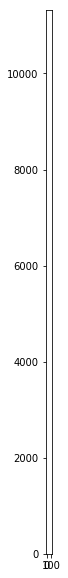

In [23]:
alterDefault('/home/mj1e16/sextractor/sextractor-master/config/',[3,5,64,3],['DETECT_THRESH','DETECT_MINAREA','BACK_SIZE','BACK_FILTERSIZE'])
fullImageTable = sextractor('/home/mj1e16/sextractor/sextractor-master/config/',imageName,'test.cat',imageDir='/home/mj1e16/sextractor/sextractor-master/config/')

(-16.6426, 1.1239)


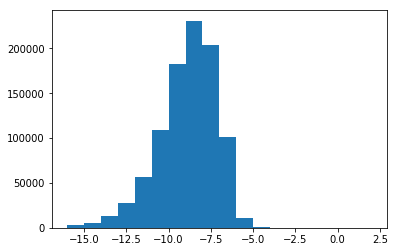

In [27]:
mags = fullImageTable['MAG_APER']
mags = [x for x in mags if x < 98]
print(min(mags),max(mags))
#     plt.hist(mags,bins='auto')
#     plt.show()

plt.hist(mags,bins=np.linspace(-16,2,19))
plt.show()